# Double QD 3D

This notebook mirrors the structure of `double_qd_removed_screening.ipynb`, but it is tailored to the 3D double-quantum-dot input `Double_Quantum_Dot_3D.in`. It keeps the same rerun/reuse workflow, reuses the standard 1D and 2D nextnano outputs, and adds dedicated helpers for browsing full 3D `.vtr` volumes, extracting arbitrary 2D slices, and plotting 1D profiles through those 3D fields.

## 0. Setup

### - Imports

In [1]:
from pathlib import Path
import re
import importlib
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import clear_output, display

try:
    import ipywidgets as widgets
    HAS_IPYWIDGETS = True
except ModuleNotFoundError:
    widgets = None
    HAS_IPYWIDGETS = False

try:
    import nextnanopy as nn
    HAS_NEXTNANOPY = True
except ModuleNotFoundError:
    nn = None
    HAS_NEXTNANOPY = False

REPO_ROOT = next(
    path for path in [Path.cwd(), *Path.cwd().parents]
    if (path / 'src').exists() and (path / 'notebooks').exists()
)
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src import nextnanopp_tools as nnt
nnt = importlib.reload(nnt)

plt.rcParams['figure.dpi'] = 120
plt.rcParams['figure.figsize'] = (10, 4.8)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 50)

print('REPO_ROOT:', REPO_ROOT)
print('ipywidgets available:', HAS_IPYWIDGETS)
print('nextnanopy available:', HAS_NEXTNANOPY)
if not HAS_NEXTNANOPY:
    print('nextnanopy is required in this notebook kernel for running inputs and loading .vtr files.')


REPO_ROOT: /Users/robertjovanov/code/qpu-design-automation-toolkit
ipywidgets available: True
nextnanopy available: True


### - Input Config

Set the 3D input file, run-reuse behavior, the standard 1D and 2D cuts that already exist in the output, and the default full-volume views you want to inspect. The current input keeps quantum disabled, so the notebook treats quantum analysis as optional and only enables it if those outputs are actually present in the run.

In [2]:
INPUT_PATH = REPO_ROOT / 'configs/robert_inputs/double_qd/3d/Double_Quantum_Dot_3D.in'
RUNS_ROOT = REPO_ROOT / 'runs'

RUN_TAG = None
FORCE_RERUN = False
REUSE_LATEST_MATCHING_RUN = True

BIAS_INDEX = 0
REGION_CUT = '1d_z_BG2'

LINECUTS_X = ['1d_x_QD']
LINECUTS_Y = ['1d_y_BG2', '1d_y_PG1', '1d_y_PG2']
LINECUTS_Z = ['1d_z_BG2', '1d_z_PG1', '1d_z_PG2']
STANDARD_CUTS = LINECUTS_X + LINECUTS_Y + LINECUTS_Z

PLANE_CUTS = {
    'xy': ['2d_xy_QD', '2d_xy_BG', '2d_xy_PG'],
    'xz': ['2d_xz_QD'],
    'yz': ['2d_yz_BG2', '2d_yz_PG1', '2d_yz_PG2'],
}

INTERACTIVE_DAT = False
INTERACTIVE_FLD = False
INTERACTIVE_VTR = True
SHOW_LANDMARKS = True

EXAMPLE_FLD_QUANTITY = 'bandedges'
EXAMPLE_FLD_VARIABLE = 'HH'
EXAMPLE_FLD_CUT = '2d_xz_QD'
EXAMPLE_FLD_LINE_AXIS = 'x'
EXAMPLE_FLD_LINE_COORDS = {'z': -4.0}

VOLUME_SLICE_QUANTITY = 'potential'
VOLUME_SLICE_VARIABLE = None
VOLUME_SLICE_AXIS = 'y'
VOLUME_SLICE_VALUE = 0.0
VOLUME_SLICE_LOG10 = False

VOLUME_LINECUT_QUANTITY = 'bandedges'
VOLUME_LINECUT_VARIABLE = 'HH'
VOLUME_LINECUT_AXIS = 'x'
VOLUME_LINECUT_COORDS = {'y': 0.0, 'z': -4.0}
VOLUME_LINECUT_LOG10 = False

EXISTING_RUNS = nnt.find_runs_for_input(RUNS_ROOT, INPUT_PATH)
MATCHING_RUNS = list(EXISTING_RUNS)

config_summary = pd.Series({
    'INPUT_PATH': str(INPUT_PATH),
    'RUNS_ROOT': str(RUNS_ROOT),
    'RUN_TAG': RUN_TAG,
    'FORCE_RERUN': FORCE_RERUN,
    'REUSE_LATEST_MATCHING_RUN': REUSE_LATEST_MATCHING_RUN,
    'MATCHING_RUNS_FOUND': len(MATCHING_RUNS),
    'REGION_CUT': REGION_CUT,
    'STANDARD_CUTS': ', '.join(STANDARD_CUTS),
    'INTERACTIVE_DAT': INTERACTIVE_DAT,
    'INTERACTIVE_FLD': INTERACTIVE_FLD,
    'INTERACTIVE_VTR': INTERACTIVE_VTR,
    'SHOW_LANDMARKS': SHOW_LANDMARKS,
    'VOLUME_SLICE': f"{VOLUME_SLICE_QUANTITY} @ {VOLUME_SLICE_AXIS}={VOLUME_SLICE_VALUE}",
    'VOLUME_LINECUT': f"{VOLUME_LINECUT_QUANTITY} along {VOLUME_LINECUT_AXIS} at {VOLUME_LINECUT_COORDS}",
})
display(config_summary.to_frame('value'))

if MATCHING_RUNS:
    print('Most recent matching runs:')
    for run in MATCHING_RUNS[-5:]:
        print(' -', run)
else:
    print('No existing runs match the current input stem.')


,value
INPUT_PATH,/Users/robertjovanov/code/qpu-design-automatio...
RUNS_ROOT,/Users/robertjovanov/code/qpu-design-automatio...
RUN_TAG,None
FORCE_RERUN,False
REUSE_LATEST_MATCHING_RUN,True
MATCHING_RUNS_FOUND,5
REGION_CUT,1d_z_BG2
STANDARD_CUTS,"1d_x_QD, 1d_y_BG2, 1d_y_PG1, 1d_y_PG2, 1d_z_BG..."
INTERACTIVE_DAT,False
INTERACTIVE_FLD,False


Most recent matching runs:
 - /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Double_Quantum_Dot_3D
 - /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Double_Quantum_Dot_3D__20260428_222906
 - /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Double_Quantum_Dot_3D__20260428_223029
 - /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Double_Quantum_Dot_3D__20260429_004136
 - /Users/robertjovanov/code/qpu-design-automation-toolkit/runs/Double_Quantum_Dot_3D__20260506_182150


### - Helper functions

These helpers keep the notebook readable while covering the 3D-specific tasks: parsing gate geometry from `simulation_input.txt`, overlaying useful x/y/z landmarks, extracting manual line cuts from `.fld` and `.vtr` files, and building interactive browsers for full 3D volumes.

In [3]:
def _marker_label(marker):
    if isinstance(marker, dict):
        return marker.get('label', '')
    return marker[1] if len(marker) > 1 else ''


def _marker_value(marker):
    if isinstance(marker, dict):
        return float(marker['value'])
    return float(marker[0])


def add_plotly_x_markers(fig, markers):
    for marker in markers or []:
        fig.add_vline(
            x=_marker_value(marker),
            line_dash=marker.get('dash', marker.get('linestyle', 'dash')) if isinstance(marker, dict) else 'dash',
            line_color=marker.get('color', 'rgba(80,80,80,0.85)') if isinstance(marker, dict) else 'rgba(80,80,80,0.85)',
            line_width=marker.get('width', marker.get('linewidth', 1.3)) if isinstance(marker, dict) else 1.3,
            opacity=marker.get('alpha', 0.85) if isinstance(marker, dict) else 0.85,
            annotation_text=_marker_label(marker) or None,
            annotation_position='top left',
        )


def add_matplotlib_x_markers(ax, markers):
    linestyle_map = {'dash': '--', 'dot': ':', 'solid': '-', 'dashdot': '-.'}
    for marker in markers or []:
        color = marker.get('color', '0.35') if isinstance(marker, dict) else '0.35'
        linestyle = marker.get('linestyle', marker.get('dash', '--')) if isinstance(marker, dict) else '--'
        linestyle = linestyle_map.get(linestyle, linestyle)
        value = _marker_value(marker)
        alpha = marker.get('alpha', 0.85) if isinstance(marker, dict) else 0.85
        ax.axvline(value, color=color, linestyle=linestyle, linewidth=1.3, alpha=alpha)
        label = _marker_label(marker)
        if label:
            ax.text(
                value,
                0.98,
                label,
                transform=ax.get_xaxis_transform(),
                rotation=90,
                va='top',
                ha='right',
                color=color,
                fontsize=8,
                alpha=alpha,
            )


def add_matplotlib_y_markers(ax, markers):
    linestyle_map = {'dash': '--', 'dot': ':', 'solid': '-', 'dashdot': '-.'}
    for marker in markers or []:
        color = marker.get('color', '0.35') if isinstance(marker, dict) else '0.35'
        linestyle = marker.get('linestyle', marker.get('dash', '--')) if isinstance(marker, dict) else '--'
        linestyle = linestyle_map.get(linestyle, linestyle)
        value = _marker_value(marker)
        alpha = marker.get('alpha', 0.85) if isinstance(marker, dict) else 0.85
        ax.axhline(value, color=color, linestyle=linestyle, linewidth=1.3, alpha=alpha)
        label = _marker_label(marker)
        if label:
            ax.text(
                0.01,
                value,
                label,
                transform=ax.get_yaxis_transform(),
                va='bottom',
                ha='left',
                color=color,
                fontsize=8,
                alpha=alpha,
                bbox=dict(facecolor='white', edgecolor='none', alpha=0.55, pad=1.5),
            )


def _plane_array(values, x, y):
    values = np.asarray(values)
    if values.shape == (len(x), len(y)):
        return values.T
    if values.shape == (len(y), len(x)):
        return values
    raise ValueError(
        f'Cannot interpret plane shape {values.shape} against x={len(x)} and y={len(y)} coordinates.'
    )


def _maybe_log10(values, log10=False):
    values = np.asarray(values, dtype=float)
    if not log10:
        return values
    return np.where(values > 0, np.log10(values), np.nan)


def parse_contact_geometries_from_simulation_input(run_root):
    text = (Path(run_root) / 'simulation_input.txt').read_text()
    origin_match = re.search(
        r'set_origin\s*\{.*?x\s*=\s*([-+0-9.eE]+).*?y\s*=\s*([-+0-9.eE]+).*?z\s*=\s*([-+0-9.eE]+).*?\}',
        text,
        flags=re.S,
    )
    origin_x = float(origin_match.group(1)) if origin_match else 0.0
    origin_y = float(origin_match.group(2)) if origin_match else 0.0
    origin_z = float(origin_match.group(3)) if origin_match else 0.0

    region_pattern = re.compile(
        r'region\s*\{(.*?)contact\s*\{\s*name\s*=\s*"([^"]+)"\s*\}',
        flags=re.S,
    )
    cuboid_pattern = re.compile(
        r'cuboid\s*\{.*?'
        r'x\s*=\s*\[\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*\].*?'
        r'y\s*=\s*\[\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*\].*?'
        r'z\s*=\s*\[\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*\]',
        flags=re.S,
    )
    cylinder_pattern = re.compile(
        r'cylinder\s*\{.*?'
        r'axis_start\s*=\s*\[\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*\].*?'
        r'axis_end\s*=\s*\[\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*,\s*([-+0-9.eE]+)\s*\].*?'
        r'radius\s*=\s*([-+0-9.eE]+)',
        flags=re.S,
    )

    records = []
    for body, name in region_pattern.findall(text):
        record = {
            'name': name,
            'geometry': 'unknown',
            'x_left': np.nan,
            'x_right': np.nan,
            'x_center': np.nan,
            'y_bottom': np.nan,
            'y_top': np.nan,
            'y_center': np.nan,
            'z_bottom': np.nan,
            'z_top': np.nan,
            'z_center': np.nan,
            'radius': np.nan,
            'cylinder_x': np.nan,
            'cylinder_y': np.nan,
            'cylinder_z_start': np.nan,
            'cylinder_z_end': np.nan,
        }

        cuboid_match = cuboid_pattern.search(body)
        if cuboid_match:
            x_left, x_right, y_bottom, y_top, z_bottom, z_top = map(float, cuboid_match.groups())
            record.update({
                'x_left': x_left - origin_x,
                'x_right': x_right - origin_x,
                'x_center': 0.5 * (x_left + x_right) - origin_x,
                'y_bottom': y_bottom - origin_y,
                'y_top': y_top - origin_y,
                'y_center': 0.5 * (y_bottom + y_top) - origin_y,
                'z_bottom': z_bottom - origin_z,
                'z_top': z_top - origin_z,
                'z_center': 0.5 * (z_bottom + z_top) - origin_z,
                'geometry': 'cuboid',
            })

        cylinder_match = cylinder_pattern.search(body)
        if cylinder_match:
            x0, y0, z0, x1, y1, z1, radius = map(float, cylinder_match.groups())
            record.update({
                'radius': radius,
                'cylinder_x': 0.5 * (x0 + x1) - origin_x,
                'cylinder_y': 0.5 * (y0 + y1) - origin_y,
                'cylinder_z_start': min(z0, z1) - origin_z,
                'cylinder_z_end': max(z0, z1) - origin_z,
            })
            record['geometry'] = 'cuboid+cylinder' if cuboid_match else 'cylinder'

        records.append(record)

    return pd.DataFrame(records)


def build_layer_landmarks(run_root, *, cut='1d_z_BG2'):
    structure_map = nnt.build_region_material_map(run_root, cut=cut).copy()
    structure_map = structure_map.sort_values('coord_min')
    ge_rows = structure_map[
        structure_map['material_name'].str.fullmatch('Ge', case=False, na=False)
        & (structure_map['thickness_nm'] > 2)
    ]
    if ge_rows.empty:
        return pd.DataFrame(), []
    ge_qw = ge_rows.iloc[(ge_rows['thickness_nm'] - ge_rows['thickness_nm'].max()).abs().argmin()]
    above_qw = structure_map[
        (structure_map['coord_min'] > ge_qw['coord_max'])
        & structure_map['material_name'].str.contains('Si', na=False)
    ].sort_values('coord_min')
    cap_top = above_qw.iloc[0]['coord_max'] if not above_qw.empty else np.nan
    rows = [
        {'kind': 'layer', 'name': 'Ge QW bottom', 'axis': 'z', 'value': float(ge_qw['coord_min'])},
        {'kind': 'layer', 'name': 'Ge QW top', 'axis': 'z', 'value': float(ge_qw['coord_max'])},
    ]
    if np.isfinite(cap_top):
        rows.append({'kind': 'layer', 'name': 'top SiGe cap', 'axis': 'z', 'value': float(cap_top)})
    df = pd.DataFrame(rows)
    markers = [
        {
            'value': row.value,
            'label': row.name,
            'color': '#0B78D0' if 'Ge QW' in row.name else '#E67E22',
            'dash': 'dash',
            'linestyle': 'dash',
            'alpha': 0.9,
        }
        for row in df.itertuples(index=False)
    ]
    return df, markers


def build_gate_landmarks(run_root, gate_names=('BG1', 'PG1', 'BG2', 'PG2', 'BG3')):
    contacts = parse_contact_geometries_from_simulation_input(run_root)
    if contacts.empty:
        return contacts, []
    gates = contacts[contacts['name'].isin(gate_names)].copy()
    if gates.empty:
        return gates, []
    gates['gate_order'] = gates['name'].map({name: idx for idx, name in enumerate(gate_names)})
    gates = gates.sort_values(['gate_order', 'x_center'])
    markers = []
    for row in gates.itertuples(index=False):
        is_plunger = str(row.name).startswith('PG')
        markers.append({
            'value': float(row.x_center),
            'label': str(row.name),
            'color': '#D62728' if is_plunger else '#2C7FB8',
            'dash': 'dash',
            'linestyle': 'dash',
            'alpha': 0.85,
        })
    return gates.drop(columns=['gate_order']), markers


def build_y_landmarks(run_root):
    contacts = parse_contact_geometries_from_simulation_input(run_root)
    if contacts.empty:
        return pd.DataFrame(), []

    rows = [
        {'kind': 'axis', 'name': 'center line', 'axis': 'y', 'value': 0.0},
    ]

    pg_rows = contacts[contacts['name'].str.startswith('PG', na=False)]
    if not pg_rows.empty:
        radii = pg_rows['radius'].dropna()
        if not radii.empty:
            radius = float(radii.iloc[0])
            rows.extend([
                {'kind': 'gate', 'name': 'PG head -R', 'axis': 'y', 'value': -radius},
                {'kind': 'gate', 'name': 'PG head +R', 'axis': 'y', 'value': radius},
            ])
        body_tops = pg_rows['y_top'].dropna()
        if not body_tops.empty:
            rows.append({'kind': 'gate', 'name': 'PG body top', 'axis': 'y', 'value': float(body_tops.max())})

    bg_rows = contacts[contacts['name'].str.startswith('BG', na=False)]
    if not bg_rows.empty:
        bg_tops = bg_rows['y_top'].dropna()
        if not bg_tops.empty:
            rows.append({'kind': 'gate', 'name': 'BG top', 'axis': 'y', 'value': float(bg_tops.max())})

    df = pd.DataFrame(rows).drop_duplicates(subset=['axis', 'value', 'name'])
    markers = []
    for row in df.itertuples(index=False):
        if row.name == 'center line':
            color = '#444444'
        elif 'PG' in row.name:
            color = '#D62728'
        else:
            color = '#2C7FB8'
        markers.append({
            'value': float(row.value),
            'label': str(row.name),
            'color': color,
            'dash': 'dash',
            'linestyle': 'dash',
            'alpha': 0.85,
        })
    return df, markers


def active_markers(markers):
    return list(markers) if SHOW_LANDMARKS else []


def markers_for_axis(axis):
    axis = str(axis).lower()
    if axis.startswith('x'):
        return active_markers(globals().get('GATE_X_MARKERS', []))
    if axis.startswith('y'):
        return active_markers(globals().get('Y_AXIS_MARKERS', []))
    if axis.startswith('z'):
        return active_markers(globals().get('LAYER_Z_MARKERS', []))
    return []


def markers_for_cut(cut):
    cut = str(cut).lower()
    if '_x_' in cut or cut.startswith('1d_x'):
        return markers_for_axis('x')
    if '_y_' in cut or cut.startswith('1d_y'):
        return markers_for_axis('y')
    if '_z_' in cut or cut.startswith('1d_z'):
        return markers_for_axis('z')
    return []


def plane_markers_for_cut(cut):
    cut = str(cut).lower()
    if '_xy_' in cut or cut.startswith('2d_xy'):
        return markers_for_axis('x'), markers_for_axis('y')
    if '_xz_' in cut or cut.startswith('2d_xz'):
        return markers_for_axis('x'), markers_for_axis('z')
    if '_yz_' in cut or cut.startswith('2d_yz'):
        return markers_for_axis('y'), markers_for_axis('z')
    return [], []


def plot_selected_dataset_linecut(
    path,
    *,
    variable=None,
    axis='x',
    fixed_coords=None,
    log10=False,
    title=None,
    prefer_nextnanopy=True,
    interactive=False,
    markers=None,
    yscale='linear',
):
    dataset = nnt.load_output_file(path, prefer_nextnanopy=prefer_nextnanopy)
    line = nnt.extract_linecut(
        dataset,
        variable=variable,
        axis=axis,
        fixed_coords=fixed_coords or {},
    )
    values = np.asarray(line['values'], dtype=float)
    ylabel = line['variable'].label or line['variable'].name
    if log10:
        values = np.where(values > 0, np.log10(values), np.nan)
        ylabel = f'log10({ylabel})'

    plot_title = title or f"{Path(path).name} along {axis} at {line['chosen_coords']}"
    if interactive:
        fig = go.Figure()
        fig.add_trace(
            go.Scatter(
                x=line['axis'],
                y=values,
                mode='lines',
                name=line['variable'].name,
            )
        )
        fig.update_layout(
            title=plot_title,
            xaxis_title=line['axis_label'],
            yaxis_title=ylabel,
            template='plotly_white',
            height=450,
        )
        if yscale == 'log':
            fig.update_yaxes(type='log')
        add_plotly_x_markers(fig, markers)
        display(fig)
    else:
        fig, ax = plt.subplots(figsize=(10, 4.2))
        ax.plot(line['axis'], values, lw=2)
        ax.set_xlabel(line['axis_label'])
        ax.set_ylabel(ylabel)
        ax.set_yscale(yscale)
        ax.set_title(plot_title)
        ax.grid(alpha=0.25)
        add_matplotlib_x_markers(ax, markers)
        plt.show()
    return line


def show_bias_plane_with_linecut(
    run_root,
    quantity,
    *,
    cut,
    variable=None,
    interactive_plane=False,
    interactive_linecut=False,
    line_axis='x',
    line_coords=None,
    log10=False,
    yscale='linear',
    bias=0,
):
    path = nnt.resolve_bias_output_file(
        run_root,
        quantity,
        cut=cut,
        bias=bias,
        preferred_extensions=('fld',),
    )
    x_markers, y_markers = plane_markers_for_cut(cut)
    if interactive_plane:
        nnt.plot_fld_interactive(
            path,
            variable=variable,
            log10=log10,
            x_markers=x_markers,
            y_markers=y_markers,
        )
    else:
        nnt.plot_fld(
            path,
            variable=variable,
            log10=log10,
            x_markers=x_markers,
            y_markers=y_markers,
        )
        plt.show()
    return plot_selected_dataset_linecut(
        path,
        variable=variable,
        axis=line_axis,
        fixed_coords=line_coords or {},
        log10=log10,
        title=f"{path.name} line cut along {line_axis} at {line_coords or {}}",
        interactive=interactive_linecut,
        markers=markers_for_axis(line_axis),
        yscale=yscale,
    )


def show_bias_volume_slice_with_linecut(
    run_root,
    quantity,
    *,
    variable=None,
    interactive_slice=False,
    interactive_linecut=False,
    slice_axis='y',
    slice_value=None,
    slice_index=None,
    line_axis='x',
    line_coords=None,
    log10=False,
    yscale='linear',
    bias=0,
):
    path = nnt.resolve_bias_output_file(
        run_root,
        quantity,
        bias=bias,
        preferred_extensions=('vtr',),
    )
    if interactive_slice:
        nnt.plot_vtr_slice_interactive(
            path,
            variable=variable,
            slice_axis=slice_axis,
            slice_value=slice_value,
            slice_index=slice_index,
            log10=log10,
        )
    else:
        nnt.plot_vtr_slice(
            path,
            variable=variable,
            slice_axis=slice_axis,
            slice_value=slice_value,
            slice_index=slice_index,
            log10=log10,
        )
        plt.show()
    return plot_selected_dataset_linecut(
        path,
        variable=variable,
        axis=line_axis,
        fixed_coords=line_coords or {},
        log10=log10,
        title=f"{path.name} line cut along {line_axis} at {line_coords or {}}",
        interactive=interactive_linecut,
        markers=markers_for_axis(line_axis),
        yscale=yscale,
    )


def plot_bias_linecuts_for_cuts(
    run_root,
    quantity,
    cuts,
    *,
    variables=None,
    yscale='linear',
    bias=0,
    interactive=False,
):
    for cut in cuts:
        try:
            nnt.plot_bias_linecut(
                run_root,
                quantity,
                cut=cut,
                bias=bias,
                variables=variables,
                interactive=interactive,
                yscale=yscale,
                markers=markers_for_cut(cut),
            )
            if not interactive:
                plt.show()
        except FileNotFoundError:
            print(f'Skipping missing {quantity} cut: {cut}')


def plot_bias_planes_for_cuts(
    run_root,
    quantity,
    cuts,
    *,
    variable=None,
    bias=0,
    interactive=False,
    log10=False,
):
    for cut in cuts:
        try:
            x_markers, y_markers = plane_markers_for_cut(cut)
            nnt.plot_bias_plane(
                run_root,
                quantity,
                cut=cut,
                bias=bias,
                variable=variable,
                interactive=interactive,
                log10=log10,
                x_markers=x_markers,
                y_markers=y_markers,
            )
            if not interactive:
                plt.show()
        except FileNotFoundError:
            print(f'Skipping missing {quantity} plane: {cut}')


def summarize_volume_dataset(path):
    dataset = nnt.load_output_file(path, prefer_nextnanopy=True)
    rows = []
    for coord_name in dataset.coord_names:
        values = np.asarray(dataset.coords[coord_name].value, dtype=float)
        diffs = np.diff(values)
        rows.append({
            'axis': coord_name,
            'points': len(values),
            'min_nm': float(values.min()),
            'max_nm': float(values.max()),
            'step_min_nm': float(diffs.min()) if len(diffs) else np.nan,
            'step_max_nm': float(diffs.max()) if len(diffs) else np.nan,
        })
    return pd.DataFrame(rows), dataset.variable_names


def collect_vtr_variables(paths):
    rows = []
    for path in paths:
        path = Path(path)
        try:
            variables = nnt.list_variables(path)
            variables_text = ', '.join(variables)
        except Exception as exc:
            variables_text = f'ERROR: {type(exc).__name__}: {exc}'
        rows.append({'file': path.name, 'variables': variables_text})
    return pd.DataFrame(rows)


def _render_plane_plotly(plane, *, title=None, log10=False, colorscale='Turbo'):
    z = _plane_array(_maybe_log10(plane['values'], log10=log10), plane['x'], plane['y'])
    variable = plane['variable']
    fig = go.Figure(
        go.Heatmap(
            x=plane['x'],
            y=plane['y'],
            z=z,
            colorscale=colorscale,
            colorbar=dict(
                title=variable.label if not log10 else f"log10({variable.label or variable.name})"
            ),
        )
    )
    fig.update_layout(
        title=title or f"{variable.name} @ {plane['slice_axis']}={plane['slice_coordinate']:.3f} nm",
        xaxis_title=plane['x_label'],
        yaxis_title=plane['y_label'],
        template='plotly_white',
        height=650,
    )
    return fig


def _render_line_plotly(line, *, title=None, log10=False, yscale='linear'):
    values = np.asarray(line['values'], dtype=float)
    ylabel = line['variable'].label or line['variable'].name
    if log10:
        values = np.where(values > 0, np.log10(values), np.nan)
        ylabel = f'log10({ylabel})'
    subtitle = ', '.join(f"{name}={value:.3f} nm" for name, value in line['chosen_coords'].items())
    fig = go.Figure(
        go.Scatter(
            x=line['axis'],
            y=values,
            mode='lines',
            name=line['variable'].name,
        )
    )
    fig.update_layout(
        title=title if not subtitle else f"{title}<br><sup>{subtitle}</sup>",
        xaxis_title=line['axis_label'],
        yaxis_title=ylabel,
        template='plotly_white',
        height=500,
    )
    if yscale == 'log':
        fig.update_yaxes(type='log')
    return fig


def make_volume_slice_browser(path, *, variable=None, slice_axis='y', log10=False, title_prefix=None):
    if not HAS_IPYWIDGETS:
        raise ModuleNotFoundError('ipywidgets is required for the volume slice browser.')

    dataset = nnt.load_output_file(path, prefer_nextnanopy=True)
    if dataset.ndim != 3:
        raise ValueError(f'Volume slice browser requires a 3D dataset, got ndim={dataset.ndim}')

    path = Path(path)
    variable_names = dataset.variable_names
    coord_names = dataset.coord_names

    axis_widget = widgets.Dropdown(
        options=coord_names,
        value=slice_axis if slice_axis in coord_names else coord_names[0],
        description='slice axis',
        layout=widgets.Layout(width='220px'),
    )
    variable_widget = widgets.Dropdown(
        options=variable_names,
        value=variable if variable in variable_names else variable_names[0],
        description='variable',
        layout=widgets.Layout(width='320px'),
    )
    index_widget = widgets.IntSlider(description='index', continuous_update=False)
    index_text = widgets.BoundedIntText(description='index box', layout=widgets.Layout(width='180px'))
    coord_widget = widgets.FloatText(description='coord [nm]', layout=widgets.Layout(width='220px'))
    play_widget = widgets.Play(interval=250, description='play')
    output = widgets.Output()
    state = {'busy': False}

    def axis_values():
        return np.asarray(dataset.coords[axis_widget.value].value, dtype=float)

    def render():
        plane = nnt.extract_plane(
            dataset,
            variable=variable_widget.value,
            slice_axis=axis_widget.value,
            slice_index=index_widget.value,
            prefer_nextnanopy=True,
        )
        title = (
            f"{title_prefix or path.name}: {plane['variable'].name} @ "
            f"{plane['slice_axis']}={plane['slice_coordinate']:.3f} nm"
        )
        fig = _render_plane_plotly(plane, title=title, log10=log10)
        with output:
            clear_output(wait=True)
            display(fig)
            print(
                f"Using slice index {plane['slice_index']} out of {len(axis_values()) - 1}; "
                f"chosen coordinate = {plane['slice_coordinate']:.6g} nm"
            )

    def refresh_axis(*_):
        values = axis_values()
        state['busy'] = True
        index_widget.max = len(values) - 1
        index_text.max = len(values) - 1
        play_widget.max = len(values) - 1
        target_index = min(index_widget.value, len(values) - 1) if len(values) else 0
        if target_index < 0:
            target_index = 0
        index_widget.value = target_index
        index_text.value = target_index
        coord_widget.value = float(values[target_index])
        state['busy'] = False
        render()

    def sync_from_slider(change):
        if state['busy']:
            return
        values = axis_values()
        idx = int(change['new'])
        state['busy'] = True
        index_text.value = idx
        coord_widget.value = float(values[idx])
        state['busy'] = False
        render()

    def sync_from_index_box(change):
        if state['busy']:
            return
        idx = int(change['new'])
        state['busy'] = True
        index_widget.value = idx
        state['busy'] = False
        render()

    def sync_from_coord(change):
        if state['busy']:
            return
        values = axis_values()
        idx = int(np.argmin(np.abs(values - float(change['new']))))
        state['busy'] = True
        index_widget.value = idx
        index_text.value = idx
        coord_widget.value = float(values[idx])
        state['busy'] = False
        render()

    axis_widget.observe(refresh_axis, names='value')
    variable_widget.observe(lambda change: render(), names='value')
    index_widget.observe(sync_from_slider, names='value')
    index_text.observe(sync_from_index_box, names='value')
    coord_widget.observe(sync_from_coord, names='value')
    widgets.jslink((play_widget, 'value'), (index_widget, 'value'))

    refresh_axis()
    controls = widgets.VBox([
        widgets.HBox([variable_widget, axis_widget]),
        widgets.HBox([play_widget, index_widget]),
        widgets.HBox([index_text, coord_widget]),
    ])
    browser = widgets.VBox([controls, output])
    display(browser)
    return browser


def make_volume_linecut_browser(path, *, variable=None, axis='x', fixed_coords=None, log10=False, yscale='linear', title_prefix=None):
    if not HAS_IPYWIDGETS:
        raise ModuleNotFoundError('ipywidgets is required for the volume line-cut browser.')

    dataset = nnt.load_output_file(path, prefer_nextnanopy=True)
    if dataset.ndim != 3:
        raise ValueError(f'Volume line-cut browser requires a 3D dataset, got ndim={dataset.ndim}')

    path = Path(path)
    fixed_coords = dict(fixed_coords or {})
    variable_names = dataset.variable_names
    coord_names = dataset.coord_names

    axis_widget = widgets.Dropdown(
        options=coord_names,
        value=axis if axis in coord_names else coord_names[0],
        description='line axis',
        layout=widgets.Layout(width='220px'),
    )
    variable_widget = widgets.Dropdown(
        options=variable_names,
        value=variable if variable in variable_names else variable_names[0],
        description='variable',
        layout=widgets.Layout(width='320px'),
    )
    coord_widgets = {}
    for coord_name in coord_names:
        values = np.asarray(dataset.coords[coord_name].value, dtype=float)
        default_value = float(fixed_coords.get(coord_name, values[len(values) // 2]))
        coord_widgets[coord_name] = widgets.FloatText(
            value=default_value,
            description=f'{coord_name} [nm]',
            layout=widgets.Layout(width='220px'),
        )

    output = widgets.Output()

    def update_disabled(*_):
        for coord_name, widget in coord_widgets.items():
            widget.disabled = coord_name == axis_widget.value

    def render(*_):
        fixed = {
            coord_name: widget.value
            for coord_name, widget in coord_widgets.items()
            if coord_name != axis_widget.value
        }
        line = nnt.extract_linecut(
            dataset,
            variable=variable_widget.value,
            axis=axis_widget.value,
            fixed_coords=fixed,
            prefer_nextnanopy=True,
        )
        title = f"{title_prefix or path.name}: {line['variable'].name} along {line['axis_name']}"
        fig = _render_line_plotly(line, title=title, log10=log10, yscale=yscale)
        with output:
            clear_output(wait=True)
            display(fig)
            print('Requested fixed coordinates:', fixed)
            print('Chosen fixed coordinates:', line['chosen_coords'])

    axis_widget.observe(update_disabled, names='value')
    axis_widget.observe(render, names='value')
    variable_widget.observe(render, names='value')
    for widget in coord_widgets.values():
        widget.observe(render, names='value')

    update_disabled()
    render()
    controls = widgets.VBox([
        widgets.HBox([variable_widget, axis_widget]),
        widgets.HBox([coord_widgets[name] for name in coord_names]),
    ])
    browser = widgets.VBox([controls, output])
    display(browser)
    return browser


## 1. 3D Simulation

Run the 3D simulation or reuse the latest existing run with the same input stem. The repository already contains a `runs/Double_Quantum_Dot_3D` example run, so by default the notebook will reuse that unless you force a rerun.

In [4]:
if FORCE_RERUN or not MATCHING_RUNS or not REUSE_LATEST_MATCHING_RUN:
    print('Running simulation...')
    inp = nnt.load_input_file(INPUT_PATH)
    inp = nnt.run_input_file(
        inp,
        output_root=RUNS_ROOT,
        tag=RUN_TAG,
        show_log=False,
        convergenceCheck=True,
    )
    RUN_ROOT = nnt.get_output_directory(inp)
else:
    print('Reusing latest matching run.')
    RUN_ROOT = MATCHING_RUNS[-1]

RUN_ROOT = nnt.resolve_run_root(RUN_ROOT)
RUN_PATHS = nnt.get_run_paths(RUN_ROOT)
BIAS0 = nnt.get_bias_dir(RUN_ROOT, bias=BIAS_INDEX)
HAS_QUANTUM_OUTPUTS = (BIAS0 / 'Quantum').exists() and any((BIAS0 / 'Quantum').rglob('*.dat'))

run_summary = pd.Series({
    'RUN_ROOT': str(RUN_ROOT),
    'RUN_NAME': RUN_ROOT.name,
    'BIAS_FOLDER': str(BIAS0),
    'job_done': (RUN_ROOT / 'job_done.txt').exists(),
    'HAS_QUANTUM_OUTPUTS': HAS_QUANTUM_OUTPUTS,
    'N_VTR_FILES_IN_BIAS': len(list(BIAS0.glob('*.vtr'))),
    'N_FLD_FILES_IN_BIAS': len(list(BIAS0.glob('*.fld'))),
    'N_DAT_FILES_IN_BIAS': len(list(BIAS0.glob('*.dat'))),
})
display(run_summary.to_frame('value'))


Reusing latest matching run.


,value
RUN_ROOT,/Users/robertjovanov/code/qpu-design-automatio...
RUN_NAME,Double_Quantum_Dot_3D__20260506_182150
BIAS_FOLDER,/Users/robertjovanov/code/qpu-design-automatio...
job_done,True
HAS_QUANTUM_OUTPUTS,False
N_VTR_FILES_IN_BIAS,8
N_FLD_FILES_IN_BIAS,56
N_DAT_FILES_IN_BIAS,56


### - Landmarks and output inventory

Build optional overlay markers from the simulated device geometry: gate-center markers along `x`, a few helpful `y` landmarks from the plunger and barrier shapes, and `z` markers for the Ge QW and the top of the SiGe cap.

In [5]:
CONTACT_GEOMETRY = parse_contact_geometries_from_simulation_input(RUN_ROOT)
LAYER_LANDMARKS, LAYER_Z_MARKERS = build_layer_landmarks(RUN_ROOT, cut=REGION_CUT)
GATE_LANDMARKS, GATE_X_MARKERS = build_gate_landmarks(RUN_ROOT)
Y_LANDMARKS, Y_AXIS_MARKERS = build_y_landmarks(RUN_ROOT)

if SHOW_LANDMARKS:
    print('Layer landmarks used for z-axis markers:')
    display(LAYER_LANDMARKS)
    print('Gate landmarks used for x-axis markers:')
    display(GATE_LANDMARKS[['name', 'geometry', 'x_left', 'x_right', 'x_center', 'y_bottom', 'y_top', 'z_bottom', 'z_top']])
    print('Y-axis landmarks used for y-cuts and yz/xy planes:')
    display(Y_LANDMARKS)
else:
    print('Landmark overlays are disabled. Set SHOW_LANDMARKS = True to enable them.')

BIAS_VTR_FILES = sorted(BIAS0.glob('*.vtr'))
STRUCTURE_VTR_FILES = sorted(RUN_PATHS.structure.glob('*.vtr'))
print('Bias-space .vtr files:')
for path in BIAS_VTR_FILES:
    print(' -', path.name)
print()
print('Structure-space .vtr files:')
for path in STRUCTURE_VTR_FILES:
    print(' -', path.name)


Layer landmarks used for z-axis markers:


,kind,name,axis,value
0,layer,Ge QW bottom,z,-14.75
1,layer,Ge QW top,z,-0.25
2,layer,top SiGe cap,z,99.95


Gate landmarks used for x-axis markers:


,name,geometry,x_left,x_right,x_center,y_bottom,y_top,z_bottom,z_top
5,BG1,cuboid,1040.0,1080.0,1060.0,-100.0,40.0,108.0,138.0
6,PG1,cuboid+cylinder,1130.0,1170.0,1150.0,0.0,100.0,143.0,173.0
7,BG2,cuboid,1220.0,1260.0,1240.0,-100.0,40.0,108.0,138.0
8,PG2,cuboid+cylinder,1310.0,1350.0,1330.0,0.0,100.0,143.0,173.0
9,BG3,cuboid,1400.0,1440.0,1420.0,-100.0,40.0,108.0,138.0


Y-axis landmarks used for y-cuts and yz/xy planes:


,kind,name,axis,value
0,axis,center line,y,0.0
1,gate,PG head -R,y,-50.0
2,gate,PG head +R,y,50.0
3,gate,PG body top,y,100.0
4,gate,BG top,y,40.0


Bias-space .vtr files:
 - bandedges.vtr
 - density_acceptor_ionized.vtr
 - density_donor_ionized.vtr
 - density_electron.vtr
 - density_hole.vtr
 - electric_field.vtr
 - electric_field_norm.vtr
 - potential.vtr

Structure-space .vtr files:
 - contacts.vtr
 - density_acceptor.vtr
 - density_fixed_charge.vtr
 - materials.vtr
 - regions_all.vtr
 - regions_material.vtr


### - XY gate footprint check

Use this section to verify the simulated top-view gate geometry before interpreting any `xy_QD` density maps. The plots below show the barrier-gate footprint, the plunger-gate footprint, and an overlay of both gate layers with transparency so you can check whether the simulated gate bodies sit where you intended in `y`.

,name,geometry,x_left,x_right,x_center,y_bottom,y_top,y_center,radius,cylinder_x,cylinder_y,z_bottom,z_top
0,BG1,cuboid,1040.0,1080.0,1060.0,-100.0,40.0,-30.0,NaN,NaN,NaN,108.0,138.0
1,PG1,cuboid+cylinder,1130.0,1170.0,1150.0,0.0,100.0,50.0,50.0,1150.0,0.0,143.0,173.0
2,BG2,cuboid,1220.0,1260.0,1240.0,-100.0,40.0,-30.0,NaN,NaN,NaN,108.0,138.0
3,PG2,cuboid+cylinder,1310.0,1350.0,1330.0,0.0,100.0,50.0,50.0,1330.0,0.0,143.0,173.0
4,BG3,cuboid,1400.0,1440.0,1420.0,-100.0,40.0,-30.0,NaN,NaN,NaN,108.0,138.0


,quantity,value
0,PG body y-range [nm],0.0 to 100.0
1,PG head center/radius [nm],"center y=0.0, R=50.0"
2,BG body y-range [nm],-100.0 to 40.0
3,Domain y-range from contacts [nm],-100.0 to 100.0


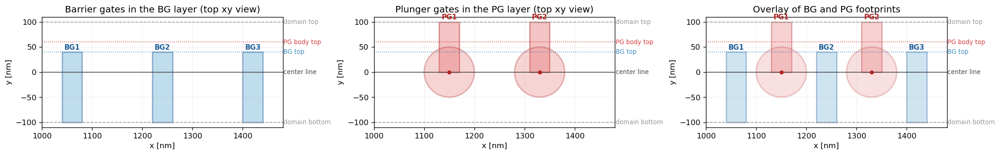

In [6]:
gate_names = ['BG1', 'PG1', 'BG2', 'PG2', 'BG3']
gate_geometry = CONTACT_GEOMETRY[CONTACT_GEOMETRY['name'].isin(gate_names)].copy()
gate_geometry = gate_geometry.sort_values('x_center').reset_index(drop=True)

if gate_geometry.empty:
    print('No gate geometry was parsed from simulation_input.txt.')
else:
    display(
        gate_geometry[
            [
                'name', 'geometry',
                'x_left', 'x_right', 'x_center',
                'y_bottom', 'y_top', 'y_center',
                'radius', 'cylinder_x', 'cylinder_y',
                'z_bottom', 'z_top',
            ]
        ]
    )

    footprint_summary = pd.DataFrame([
        {
            'quantity': 'PG body y-range [nm]',
            'value': ', '.join(
                sorted({f"{row.y_bottom:.1f} to {row.y_top:.1f}" for row in gate_geometry[gate_geometry['name'].str.startswith('PG')].itertuples(index=False)})
            ),
        },
        {
            'quantity': 'PG head center/radius [nm]',
            'value': ', '.join(
                sorted({f"center y={row.cylinder_y:.1f}, R={row.radius:.1f}" for row in gate_geometry[gate_geometry['name'].str.startswith('PG')].itertuples(index=False) if np.isfinite(row.radius)})
            ),
        },
        {
            'quantity': 'BG body y-range [nm]',
            'value': ', '.join(
                sorted({f"{row.y_bottom:.1f} to {row.y_top:.1f}" for row in gate_geometry[gate_geometry['name'].str.startswith('BG')].itertuples(index=False)})
            ),
        },
        {
            'quantity': 'Domain y-range from contacts [nm]',
            'value': f"{CONTACT_GEOMETRY['y_bottom'].min():.1f} to {CONTACT_GEOMETRY['y_top'].max():.1f}",
        },
    ])
    display(footprint_summary)

    def _draw_gate_xy(ax, rows, *, include_plungers=True, include_barriers=True, title='', overlay=False):
        guide_specs = [
            (-100.0, 'domain bottom', '0.55', '--'),
            (0.0, 'center line', '0.2', '-'),
            (40.0, 'BG top', '#2C7FB8', ':'),
            (60.0, 'PG body top', '#D62728', ':'),
            (100.0, 'domain top', '0.55', '--'),
        ]
        for y_value, label, color, linestyle in guide_specs:
            ax.axhline(y_value, color=color, linestyle=linestyle, linewidth=1.0, alpha=0.85)
            ax.text(
                1.003,
                y_value,
                label,
                transform=ax.get_yaxis_transform(),
                va='center',
                ha='left',
                color=color,
                fontsize=8,
                alpha=0.9,
            )

        for row in rows.itertuples(index=False):
            is_plunger = row.name.startswith('PG')
            if is_plunger and not include_plungers:
                continue
            if (not is_plunger) and not include_barriers:
                continue

            edge = '#B22222' if is_plunger else '#1F5E99'
            fill = '#E57373' if is_plunger else '#6BAED6'
            alpha_rect = 0.32 if overlay else 0.42
            alpha_circle = 0.22 if overlay else 0.30

            if np.isfinite(row.x_left) and np.isfinite(row.y_bottom):
                rect = plt.Rectangle(
                    (row.x_left, row.y_bottom),
                    row.x_right - row.x_left,
                    row.y_top - row.y_bottom,
                    facecolor=fill,
                    edgecolor=edge,
                    linewidth=1.8,
                    alpha=alpha_rect,
                )
                ax.add_patch(rect)
                ax.text(
                    row.x_center,
                    row.y_top + 2.5,
                    row.name,
                    color=edge,
                    ha='center',
                    va='bottom',
                    fontsize=9,
                    weight='bold',
                )

            if np.isfinite(row.radius):
                circ = plt.Circle(
                    (row.cylinder_x, row.cylinder_y),
                    row.radius,
                    facecolor=fill,
                    edgecolor=edge,
                    linewidth=1.8,
                    alpha=alpha_circle,
                )
                ax.add_patch(circ)
                ax.scatter([row.cylinder_x], [row.cylinder_y], color=edge, s=18, zorder=4)

        x_min = float(rows['x_left'].min()) - 40.0
        x_max = float(rows['x_right'].max()) + 40.0
        y_min = float(np.nanmin(rows['y_bottom'])) - 10.0
        y_max = float(np.nanmax(rows['y_top'])) + 10.0
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_aspect('equal')
        ax.set_xlabel('x [nm]')
        ax.set_ylabel('y [nm]')
        ax.set_title(title)
        ax.grid(alpha=0.18)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5.6), constrained_layout=True)
    _draw_gate_xy(
        axes[0],
        gate_geometry,
        include_plungers=False,
        include_barriers=True,
        title='Barrier gates in the BG layer (top xy view)',
    )
    _draw_gate_xy(
        axes[1],
        gate_geometry,
        include_plungers=True,
        include_barriers=False,
        title='Plunger gates in the PG layer (top xy view)',
    )
    _draw_gate_xy(
        axes[2],
        gate_geometry,
        include_plungers=True,
        include_barriers=True,
        title='Overlay of BG and PG footprints',
        overlay=True,
    )
    plt.show()


### - Accumulation diagnostics

Start with the fast run-level checks: the integrated hole density mapped onto the material stack and the total charge summary from `total_charges.txt`.

,integrated_region_index,structure_region_index,material_name,coord_min,coord_max,thickness_nm
0,3,2,Ge,-14.75,-0.25,14.5
1,4,3,Si(x)Ge(1-x),0.25,99.95,99.7
2,5,4,Si(x)Ge(1-x),100.05,100.95,0.9


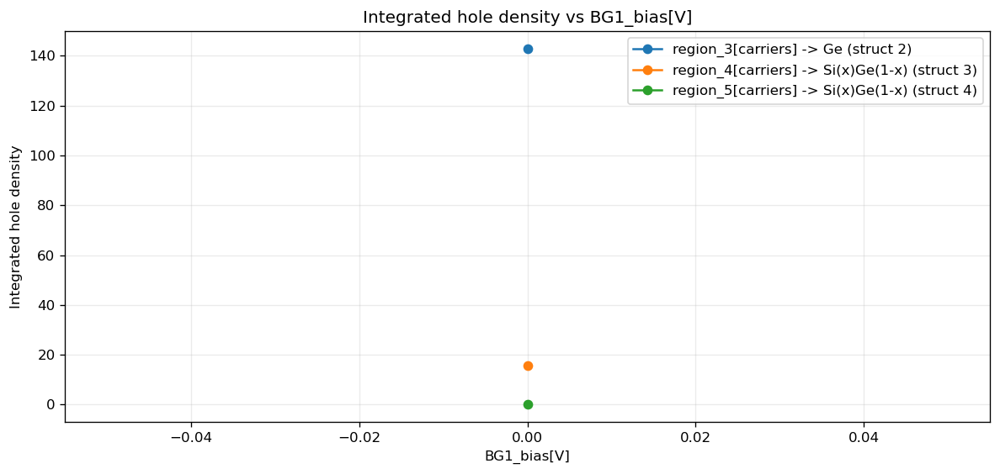

In [8]:
integrated_map = nnt.map_integrated_density_regions(RUN_ROOT, cut=REGION_CUT)
display(
    integrated_map[
        [
            'integrated_region_index',
            'structure_region_index',
            'material_name',
            'coord_min',
            'coord_max',
            'thickness_nm',
        ]
    ]
)

nnt.plot_integrated_density_hole(
    RUN_ROOT,
    interactive=False,
    label_with_materials=True,
    cut=REGION_CUT,
)
plt.show()


In [10]:
total_charges = nnt.read_total_charges(BIAS0)
display(total_charges.style.format({'value': '{:.3e}'}))


,quantity,value,unit
0,electrons,-2.354e-303,e
1,holes,1.428e+02,e
2,ionized donors,0.000e+00,e
3,ionized acceptors,-0.000e+00,e
4,fixed charges,0.000e+00,e
5,polarization_total,0.000e+00,e
6,polarization_piezo,0.000e+00,e
7,sum,1.428e+02,e


## 2. 1D .dat Diagnostics

The 3D run already writes the standard 1D cuts through the QD axis (`x`) and through the PG/BG locations (`y`, `z`). These are still the fastest way to compare electrostatics and densities between the main device directions.

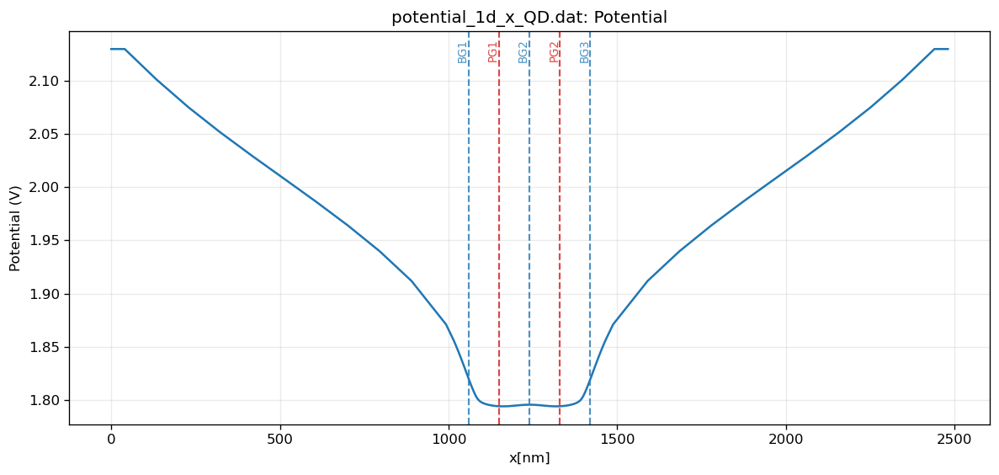

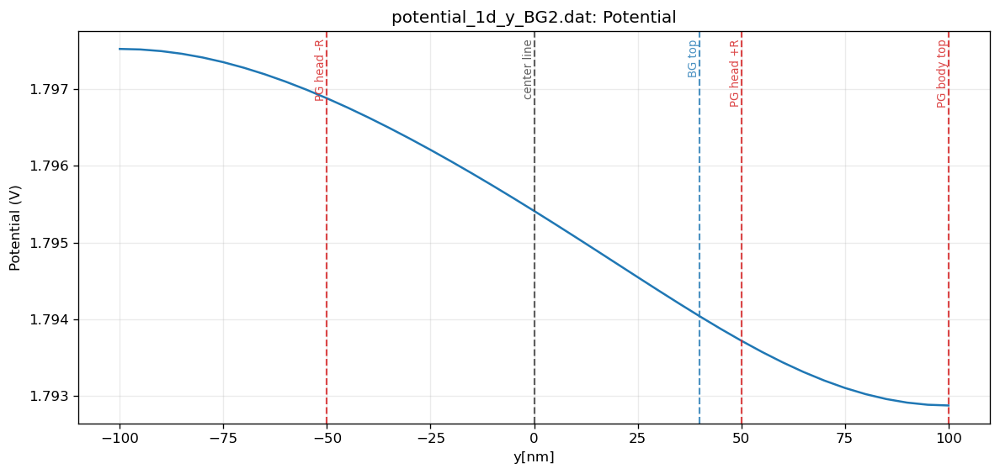

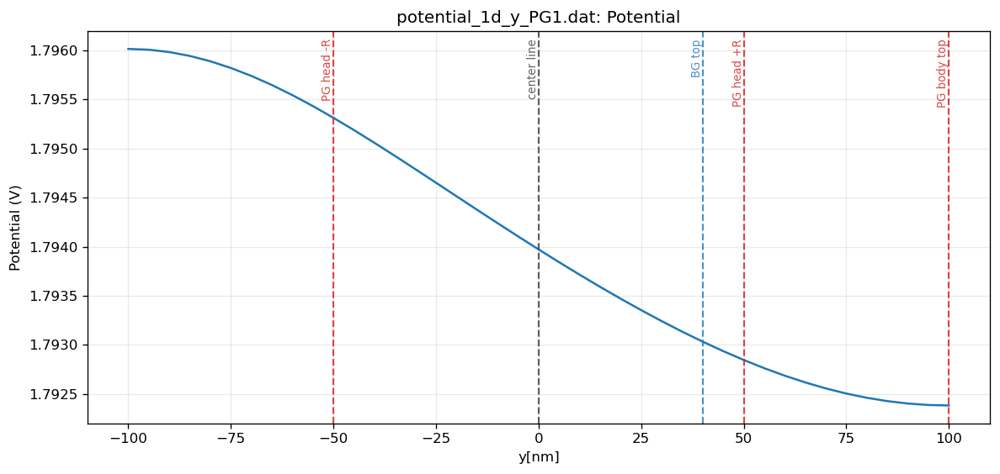

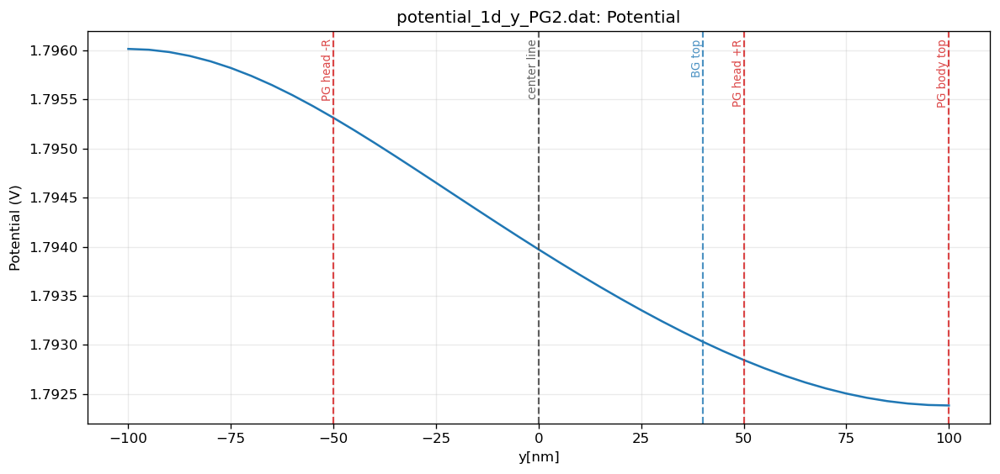

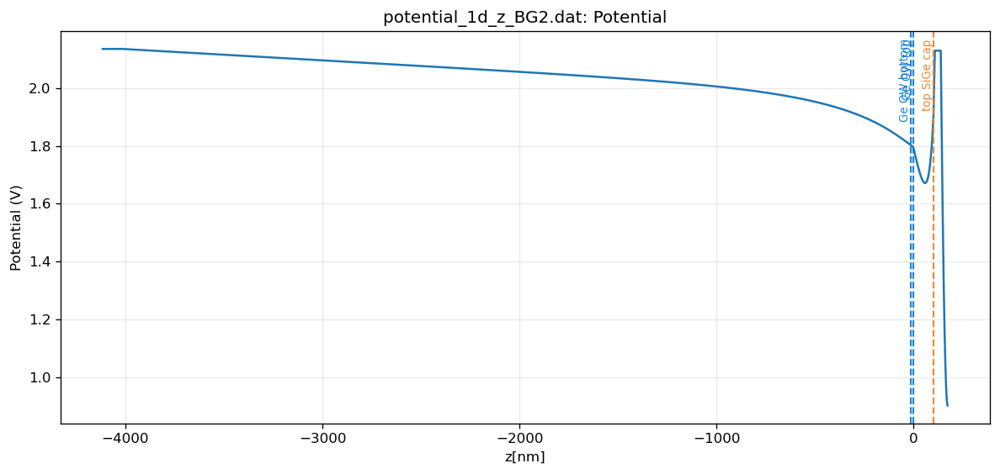

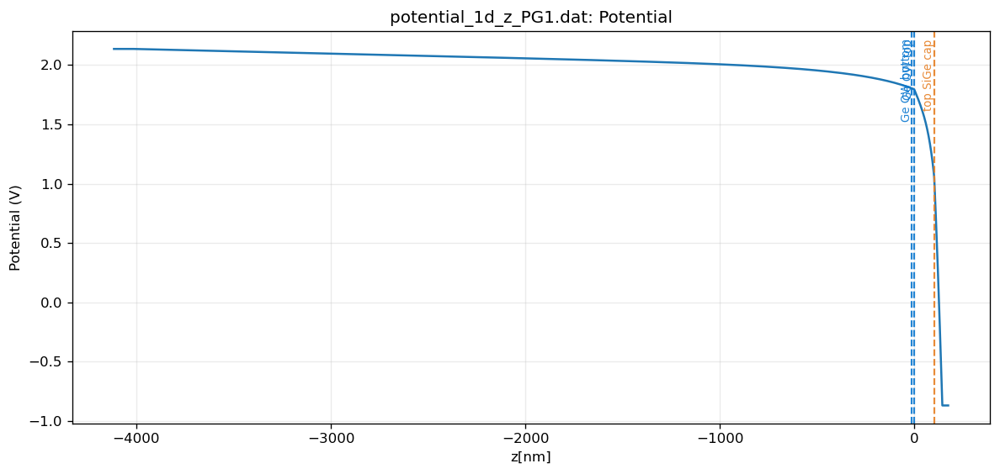

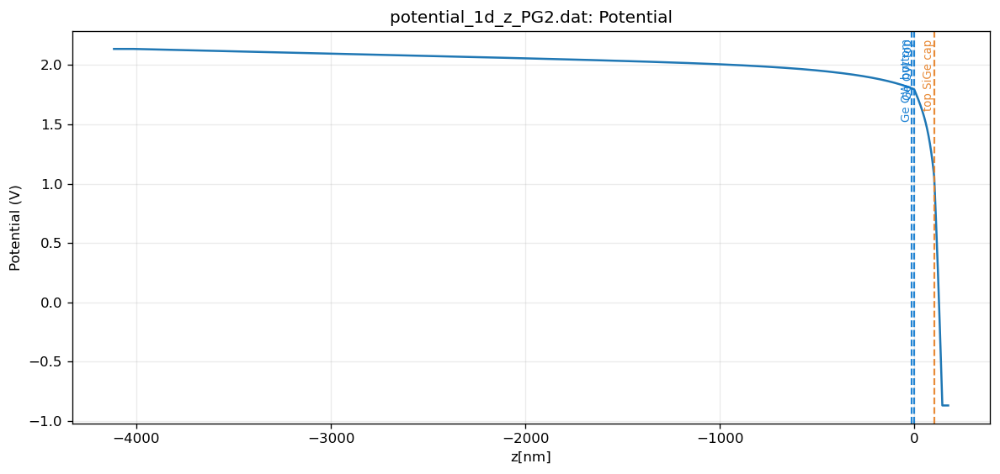

In [11]:
plot_bias_linecuts_for_cuts(
    RUN_ROOT,
    'potential',
    STANDARD_CUTS,
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_DAT,
)


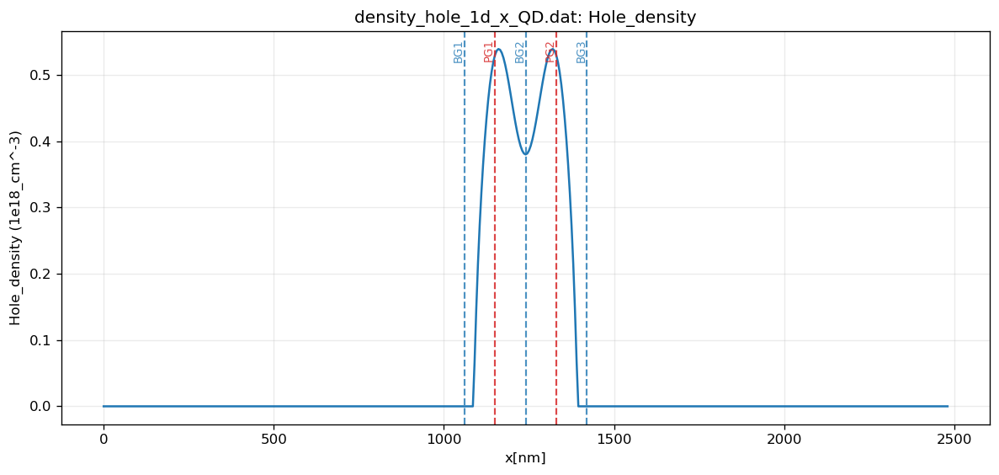

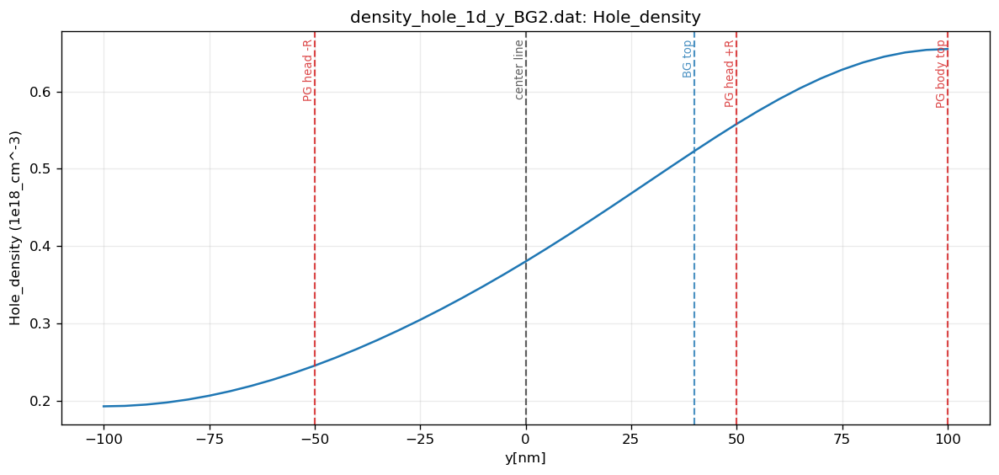

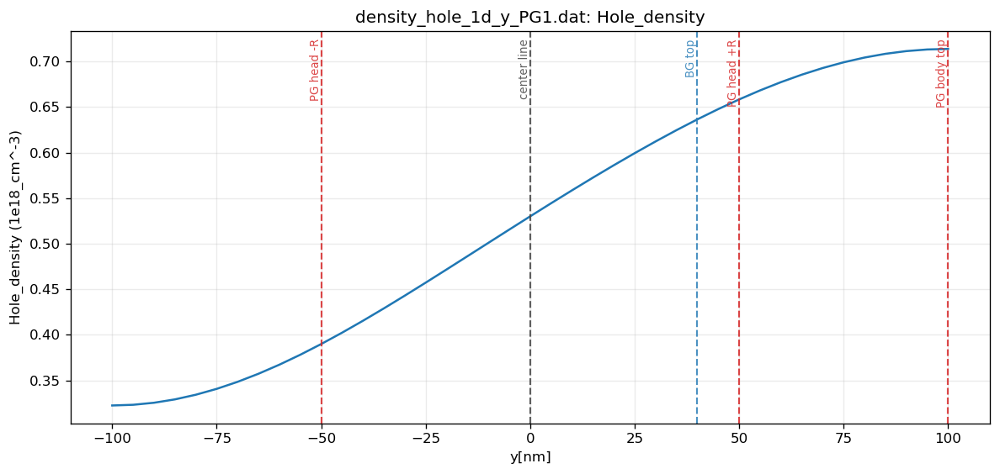

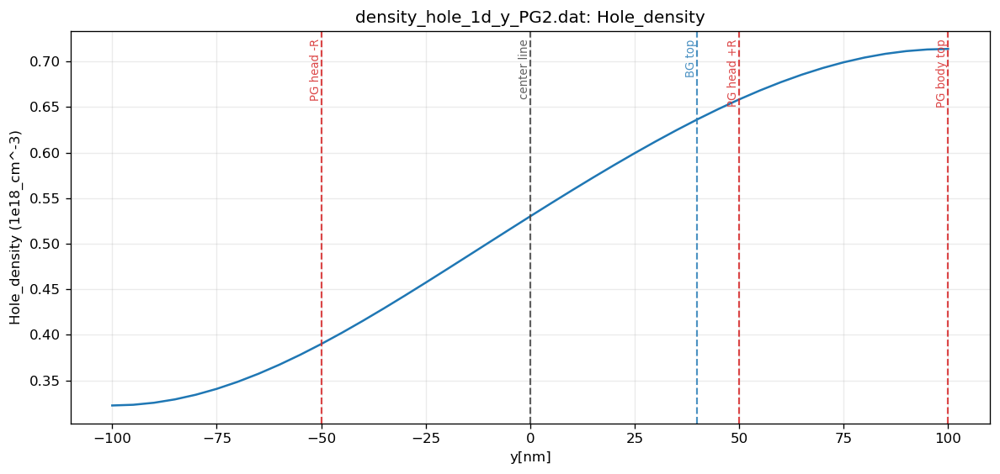

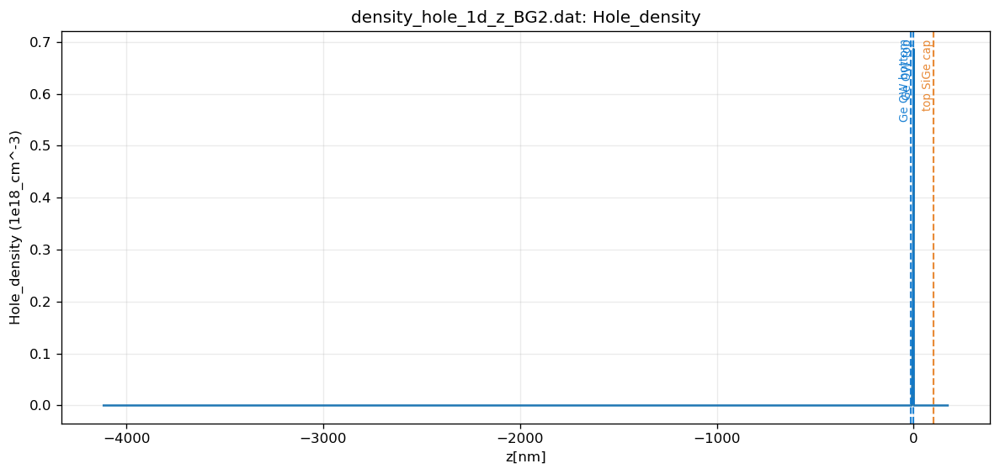

...

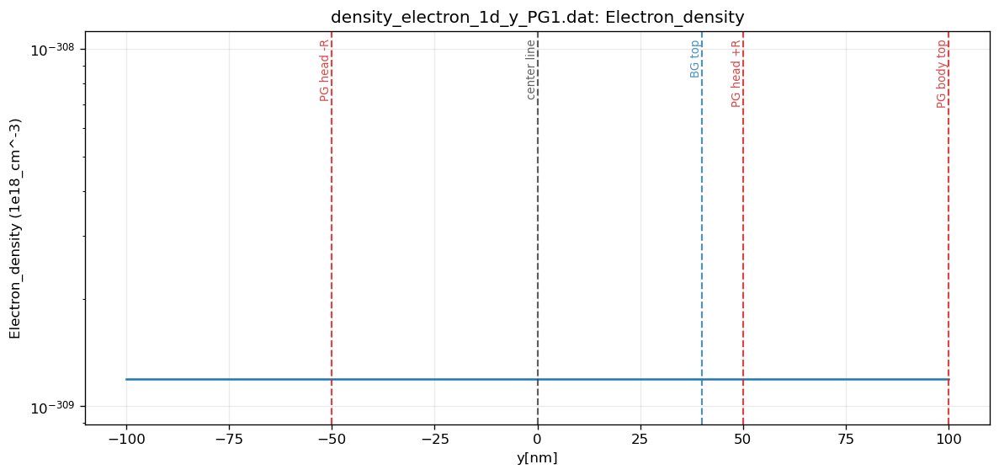

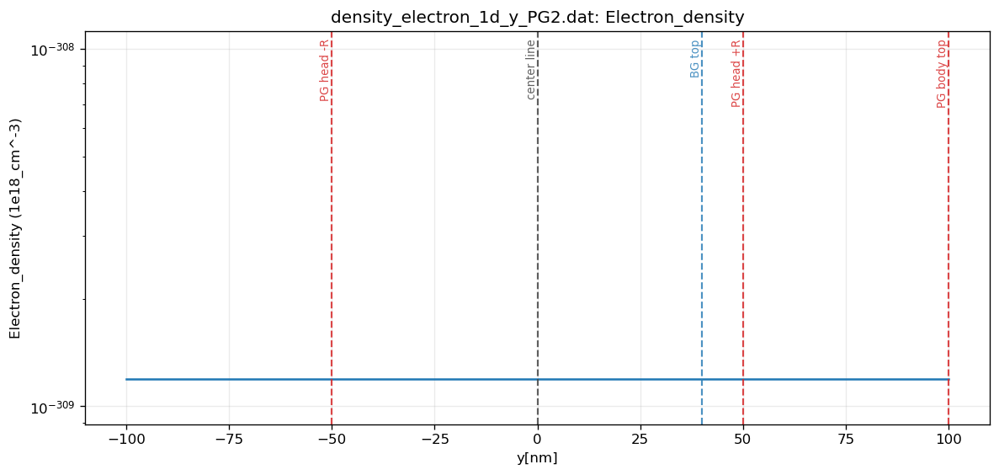

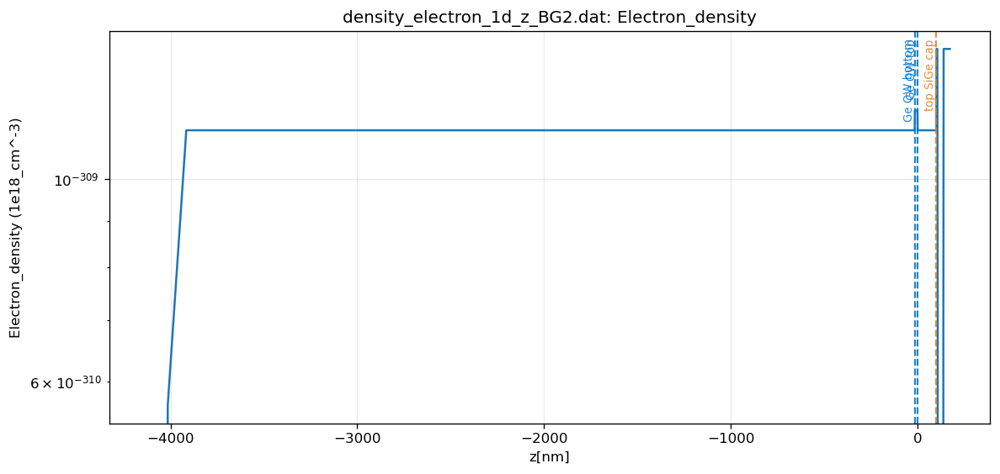

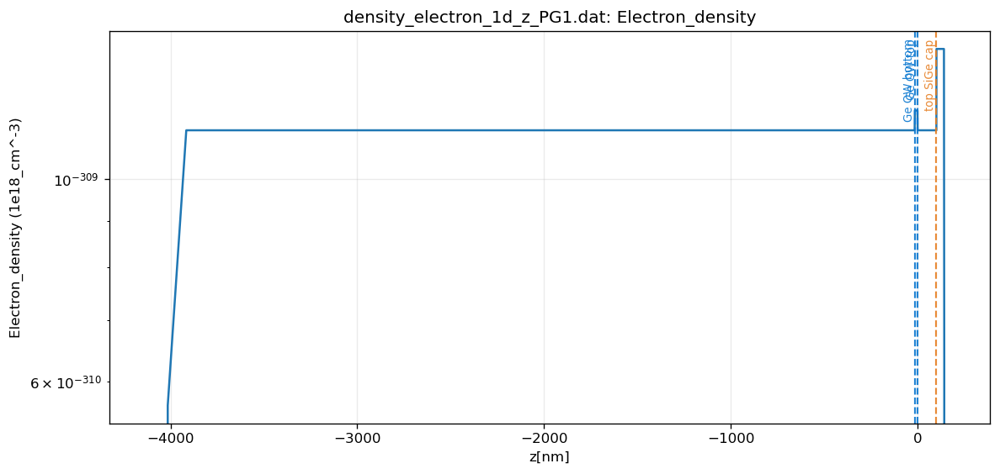

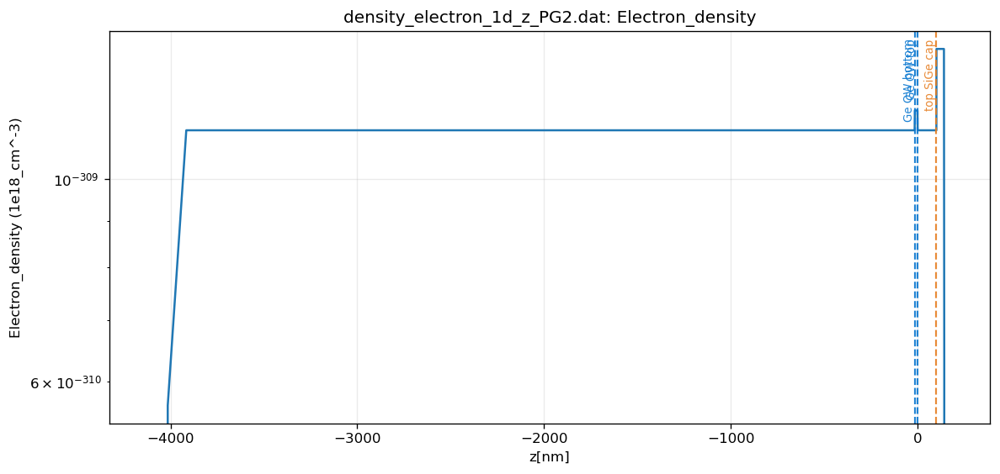

In [12]:
plot_bias_linecuts_for_cuts(
    RUN_ROOT,
    'density_hole',
    STANDARD_CUTS,
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_DAT,
)

plot_bias_linecuts_for_cuts(
    RUN_ROOT,
    'density_electron',
    STANDARD_CUTS,
    yscale='log',
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_DAT,
)


In [13]:
INTERACTIVE_DAT = True

In [14]:
plot_bias_linecuts_for_cuts(
    RUN_ROOT,
    'bandedges',
    STANDARD_CUTS,
    variables=['HH', 'LH', 'hole_Fermi_level', 'electron_Fermi_level'],
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_DAT,
)


## 3. 2D .fld Cuts

The 3D input also writes targeted 2D cuts in the `xy`, `xz`, and `yz` planes. These are useful both as quick diagnostics on their own and as a bridge between the simple 1D outputs and the full 3D volume files.

In [15]:
INTERACTIVE_FLD = True
INTERACTIVE_DAT = True

In [16]:
example_fld_line = show_bias_plane_with_linecut(
    RUN_ROOT,
    EXAMPLE_FLD_QUANTITY,
    cut=EXAMPLE_FLD_CUT,
    variable=EXAMPLE_FLD_VARIABLE,
    interactive_plane=INTERACTIVE_FLD,
    interactive_linecut=INTERACTIVE_DAT,
    line_axis=EXAMPLE_FLD_LINE_AXIS,
    line_coords=EXAMPLE_FLD_LINE_COORDS,
    bias=BIAS_INDEX,
)
print('Chosen .fld line cut:', example_fld_line['chosen_coords'])


Chosen .fld line cut: {'z': -4.0}


In [17]:
plot_bias_planes_for_cuts(
    RUN_ROOT,
    'potential',
    PLANE_CUTS['xy'] + PLANE_CUTS['xz'] + PLANE_CUTS['yz'],
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_FLD,
)


In [18]:
plot_bias_planes_for_cuts(
    RUN_ROOT,
    'density_hole',
    PLANE_CUTS['xy'] + PLANE_CUTS['xz'] + PLANE_CUTS['yz'],
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_FLD,
)


In [20]:
plot_bias_planes_for_cuts(
    RUN_ROOT,
    'electric_field_norm',
    PLANE_CUTS['xy'] + PLANE_CUTS['xz'] + PLANE_CUTS['yz'],
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_FLD,
)

plot_bias_planes_for_cuts(
    RUN_ROOT,
    'bandedges',
    ['2d_xy_QD', '2d_xz_QD', '2d_yz_PG1'],
    variable='HH',
    bias=BIAS_INDEX,
    interactive=INTERACTIVE_FLD,
)


## 4. 3D .vtr Volumes

This is the 3D-specific part of the workflow. The cells below inspect the full volume files, list their variables, extract arbitrary 2D slices from them, and then add interactive browsers so you can move through `x`, `y`, or `z` with a slider or numeric input.

In [22]:
display(collect_vtr_variables(BIAS_VTR_FILES))


,file,variables
0,bandedges.vtr,"Gamma, Delta_1, Delta_2, Delta_3, L_1, L_2, L_..."
1,density_acceptor_ionized.vtr,Ionized_acceptor_density
2,density_donor_ionized.vtr,Ionized_donor_density
3,density_electron.vtr,Electron_density
4,density_hole.vtr,Hole_density
5,electric_field.vtr,"E_x, E_y, E_z"
6,electric_field_norm.vtr,E_norm
7,potential.vtr,Potential


In [23]:
volume_path = nnt.resolve_bias_output_file(
    RUN_ROOT,
    VOLUME_SLICE_QUANTITY,
    bias=BIAS_INDEX,
    preferred_extensions=('vtr',),
)
coord_summary, volume_variables = summarize_volume_dataset(volume_path)
display(coord_summary)
print('Selected volume file:', volume_path.name)
print('Variables:', volume_variables)


,axis,points,min_nm,max_nm,step_min_nm,step_max_nm
0,x,123,0.0,2480.0,5.000000,102.375366
1,y,41,-100.0,100.0,5.000000,5.000000
2,z,554,-4115.0,173.0,0.099998,100.000000


Selected volume file: potential.vtr
Variables: ['Potential']


In [24]:
volume_line = show_bias_volume_slice_with_linecut(
    RUN_ROOT,
    VOLUME_SLICE_QUANTITY,
    variable=VOLUME_SLICE_VARIABLE,
    interactive_slice=INTERACTIVE_VTR,
    interactive_linecut=INTERACTIVE_DAT,
    slice_axis=VOLUME_SLICE_AXIS,
    slice_value=VOLUME_SLICE_VALUE,
    line_axis=VOLUME_LINECUT_AXIS,
    line_coords=VOLUME_LINECUT_COORDS,
    log10=VOLUME_SLICE_LOG10,
    bias=BIAS_INDEX,
)
print('Chosen .vtr line cut:', volume_line['chosen_coords'])


Chosen .vtr line cut: {'y': 0.0, 'z': -4.0}


In [26]:
nnt.plot_bias_volume_slice(
    RUN_ROOT,
    'density_hole',
    bias=BIAS_INDEX,
    slice_axis='y',
    slice_value=0.0,
    interactive=INTERACTIVE_VTR,
    log10=True,
)
if not INTERACTIVE_VTR:
    plt.show()

nnt.plot_bias_volume_slice(
    RUN_ROOT,
    'electric_field_norm',
    bias=BIAS_INDEX,
    slice_axis='y',
    slice_value=0.0,
    interactive=INTERACTIVE_VTR,
)
if not INTERACTIVE_VTR:
    plt.show()

nnt.plot_bias_volume_slice(
    RUN_ROOT,
    'bandedges',
    variable='HH',
    bias=BIAS_INDEX,
    slice_axis='y',
    slice_value=0.0,
    interactive=INTERACTIVE_VTR,
)
if not INTERACTIVE_VTR:
    plt.show()

nnt.plot_bias_volume_slice(
    RUN_ROOT,
    'electric_field',
    variable='E_y',
    bias=BIAS_INDEX,
    slice_axis='y',
    slice_value=0.0,
    interactive=INTERACTIVE_VTR,
)
if not INTERACTIVE_VTR:
    plt.show()


### - Interactive volume slice browser

Use this browser to step through the full 3D field with a dropdown for the slice axis and both a slider and a numeric input for the slice position. The numeric input snaps to the nearest available simulation grid coordinate.

In [32]:
VOLUME_SLICE_QUANTITY = 'potential'

In [ ]:
slice_browser_path = nnt.resolve_bias_output_file(
    RUN_ROOT,
    VOLUME_SLICE_QUANTITY,
    bias=BIAS_INDEX,
    preferred_extensions=('vtr',),
)
make_volume_slice_browser(
    slice_browser_path,
    variable=VOLUME_SLICE_VARIABLE,
    slice_axis=VOLUME_SLICE_AXIS,
    log10=VOLUME_SLICE_LOG10,
)


### - Interactive volume line-cut browser

Use this browser when you want explicit 1D profiles through the 3D field. Pick the line axis, enter target coordinates for the other two directions, and the helper will extract the nearest available grid line and report the exact coordinates it used.

In [29]:
linecut_browser_path = nnt.resolve_bias_output_file(
    RUN_ROOT,
    VOLUME_LINECUT_QUANTITY,
    bias=BIAS_INDEX,
    preferred_extensions=('vtr',),
)
make_volume_linecut_browser(
    linecut_browser_path,
    variable=VOLUME_LINECUT_VARIABLE,
    axis=VOLUME_LINECUT_AXIS,
    fixed_coords=VOLUME_LINECUT_COORDS,
    log10=VOLUME_LINECUT_LOG10,
)


## 5. Optional Structure Volume Browsers

The same 3D browser helpers also work for the structure volumes. This is often the quickest way to verify that the electrostatic slices you are inspecting line up with the intended material stack, contacts, and region map.

In [30]:
structure_volume_paths = [
    RUN_PATHS.structure / 'materials.vtr',
    RUN_PATHS.structure / 'regions_material.vtr',
    RUN_PATHS.structure / 'contacts.vtr',
]
display(collect_vtr_variables(structure_volume_paths))

structure_coords, structure_variables = summarize_volume_dataset(structure_volume_paths[0])
display(structure_coords)
print('Structure variables in materials.vtr:', structure_variables)


,file,variables
0,materials.vtr,Material_index
1,regions_material.vtr,Region_index
2,contacts.vtr,Contact_index


,axis,points,min_nm,max_nm,step_min_nm,step_max_nm
0,x,122,5.22034,2474.779541,5.000000,98.409912
1,y,40,-97.50000,97.500000,5.000000,5.000000
2,z,553,-4065.00000,172.000000,0.099998,99.654785


Structure variables in materials.vtr: ['Material_index']


In [31]:
make_volume_slice_browser(
    RUN_PATHS.structure / 'materials.vtr',
    variable='Material_index',
    slice_axis='y',
    log10=False,
    title_prefix='materials.vtr',
)


## 6. Optional Quantum Section

The current 3D input sets `$quantum = 0`, so the run usually has no `Quantum/` outputs. This cell keeps the same workflow idea as the 2D notebook, but it only runs when quantum data is present.

In [ ]:
if HAS_QUANTUM_OUTPUTS:
    quantum_root = BIAS0 / 'Quantum'
    quantum_files = sorted(path.relative_to(BIAS0) for path in quantum_root.rglob('*') if path.is_file())
    print('Quantum files found:')
    for path in quantum_files[:40]:
        print(' -', path)
else:
    print('No quantum outputs were found for this 3D run.')
    print('That is expected for the current input, which sets $quantum = 0 and $quantum_poisson = 0.')
    print('Enable one of those flags and rerun if you want the notebook to populate a quantum-analysis section.')
